<a href="https://colab.research.google.com/github/MuhammadAwais-32013/S_FYP/blob/main/FYP_Yolo_Traning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Sign_TO_Text

In [ ]:
!pip install -U ultralytics
!pip install torch

#### Import required modules
import time
import threading
from ultralytics import YOLO

# Load the YOLOv8 model
model = YOLO("yolov8n.pt")
# data_path = "/kaggle/input/full-and-test/data.yaml"
data_path = "/kaggle/input/fyp2-30valid/data.yaml"

# Define training parameters
model.train(
    data=data_path,
    epochs=500,
    patience=20,
    project="YOLOv8",          # Custom project name
    name="sign_train",         # Experiment name
    batch=32,                  # Batch size
    device="cuda",             # Use GPU if available
    cache=False,
    save_period=30,            # Save checkpoint every 30 epochs
    cos_lr=True,
    optimizer='AdamW',          # Use Adam optimizer
    box=6.0,                   # Correct default for box loss
    cls=0.6,                   # Default for class loss
    dfl=1.5,
    lr0 = 0.0001,  # Initial learning rate
    lrf = 0.01,    # Final learning rate will be lr0 * lrf = 0.0001 * 0.01 = 0.000001
    # Default for DFL
)


def keep_alive():
    """Function to keep the session alive."""
    while True:
        time.sleep(60 * 5)  # Sleep for 5 minutes to prevent timeout
        print("Session is alive")

# Run keep_alive function in a separate thread to avoid blocking training
thread = threading.Thread(target=keep_alive)
thread.daemon = True  # Daemonize thread to exit when the main program ends
thread.start()

#You Only Look Once (YOLO)


##Required Libraries

In [2]:
!pip install ultralytics

In [3]:
from IPython.display import display, Video
import numpy as np
import cv2
from matplotlib import pyplot as plt
from ultralytics import YOLO

##Test Pretrain Volo

###Single Image for Prediction

In [ ]:
# !pip uninstall -y torch torchvision torchaudio ultralytics

Found existing installation: torch 2.7.0
Uninstalling torch-2.7.0:
  Successfully uninstalled torch-2.7.0
Found existing installation: torchvision 0.22.0
Uninstalling torchvision-0.22.0:
  Successfully uninstalled torchvision-0.22.0
Found existing installation: ultralytics 8.3.137
Uninstalling ultralytics-8.3.137:
  Successfully uninstalled ultralytics-8.3.137


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8m.pt')  # load an official model
# model = YOLO('yolov8n.yaml')  # build a new model from YAML
# Download a sample traffic image
# !wget https://ultralytics.com/images/bus.jpg

# Run detection
# results = model("bus.jpg", save=False)  # It will save image with boxes
# Image path from Google Drive
# image_path = "/content/drive/MyDrive/DataSet/7upChock_Image_1.jpg"

# Run detection
# results = model(image_path, save=False)
# Run detection on a video
# results = model("your_video.mp4", save=True)

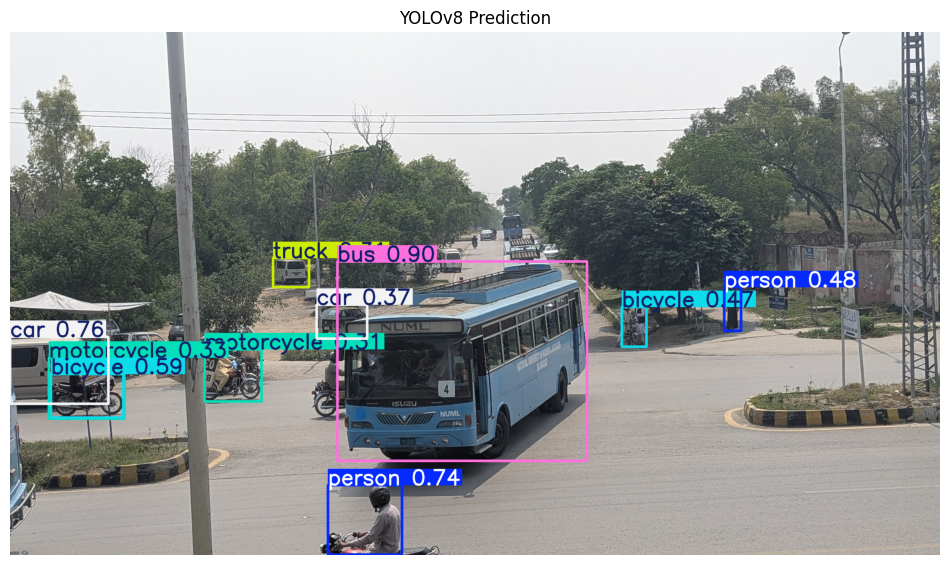

In [ ]:

# results[0].plot() returns an image (NumPy array with boxes drawn)
output_img = results[0].plot()

# Display it using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("YOLOv8 Prediction")
plt.show()

In [ ]:
image_path = "/content/drive/MyDrive/DataSet/7upChock_Image_5.jpg"

# Run detection
results = model(image_path, save=False)


image 1/1 /content/drive/MyDrive/DataSet/7upChock_Image_5.jpg: 640x384 5 persons, 2 bicycles, 7 cars, 2 motorcycles, 1 bus, 1 truck, 1082.7ms
Speed: 4.6ms preprocess, 1082.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 384)


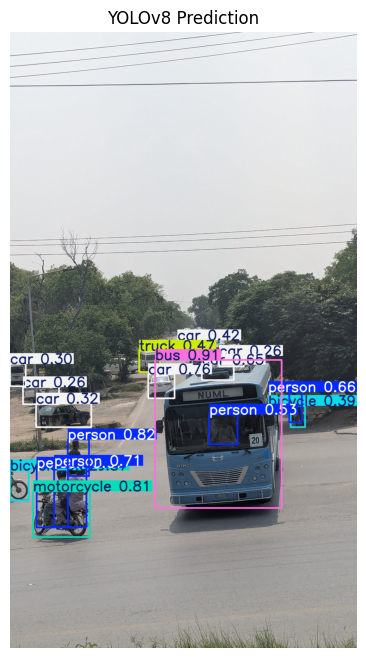

In [ ]:
# results[0].plot() returns an image (NumPy array with boxes drawn)
output_img = results[0].plot()

# Display it using matplotlib
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("YOLOv8 Prediction")
plt.show()

###Multiple Images To predict

In [13]:
# Load the model
model = YOLO("yolov8m.pt")
image_paths = [
    "/content/drive/MyDrive/DataSet/7upChock_Image_1.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_2.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_3.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_4.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_5.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_6.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_7.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_8.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_9.jpg"


]



0: 640x640 10 persons, 5 cars, 5 motorcycles, 1 bus, 2 trucks, 2309.9ms
1: 640x640 7 persons, 2 cars, 2 motorcycles, 1 bus, 1 truck, 2309.9ms
2: 640x640 8 persons, 1 bicycle, 4 cars, 1 motorcycle, 5 buss, 2309.9ms
3: 640x640 6 persons, 3 bicycles, 6 cars, 1 motorcycle, 4 buss, 1 truck, 2309.9ms
4: 640x640 5 persons, 2 bicycles, 6 cars, 2 motorcycles, 1 bus, 2 trucks, 2309.9ms
5: 640x640 6 persons, 6 cars, 5 motorcycles, 1 truck, 2309.9ms
6: 640x640 7 persons, 4 cars, 2 motorcycles, 3 trucks, 2309.9ms
7: 640x640 8 persons, 4 cars, 3 motorcycles, 3 trucks, 1 fire hydrant, 2309.9ms
8: 640x640 1 bus, 1 truck, 2309.9ms
Speed: 4.2ms preprocess, 2309.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


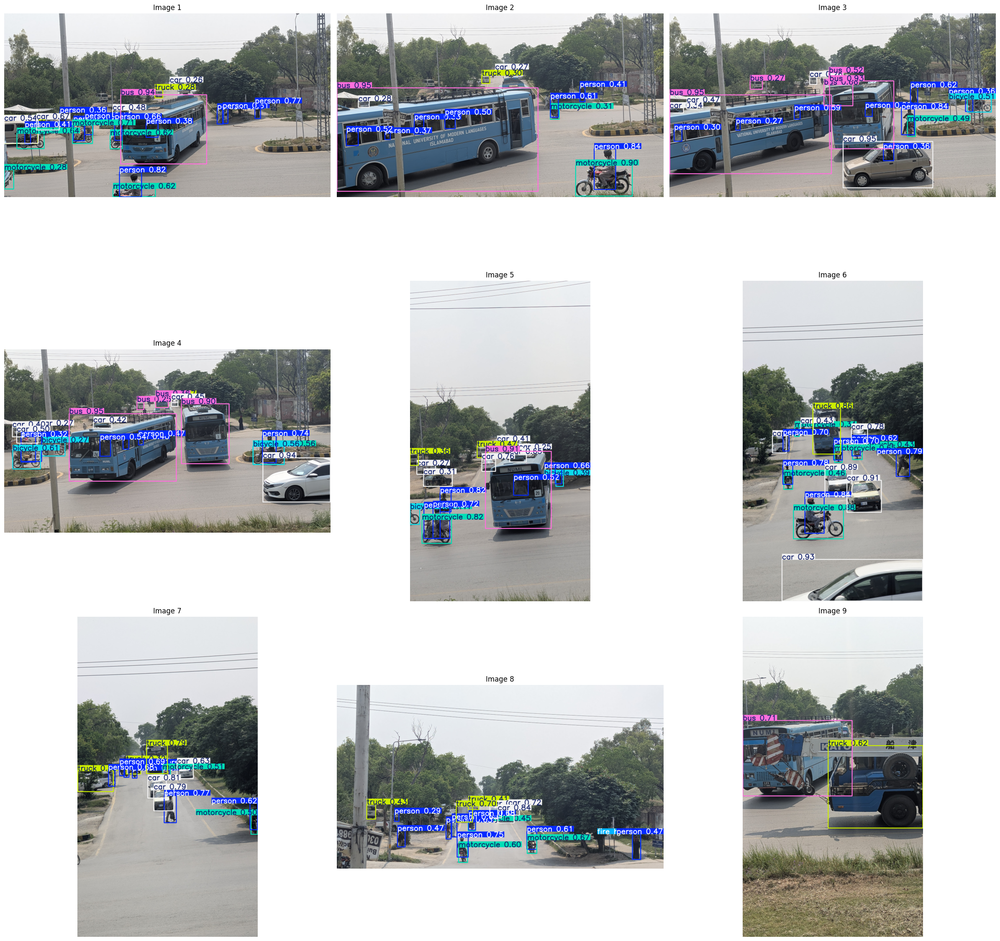

In [14]:
# Run YOLO on all images
results = model(image_paths, save=False)

# Plot all images with bounding boxes

plt.figure(figsize=(24, 24))  # Adjust size as needed

for i, r in enumerate(results):
    # Plot image with bounding boxes
    img = r.plot()
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 3x3 grid (3 rows, 3 columns)
    plt.subplot(3, 3, i+1)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"Image {i+1}")

plt.tight_layout()
plt.show()



0: 640x640 10 persons, 5 cars, 5 motorcycles, 1 bus, 2 trucks, 1906.4ms
1: 640x640 7 persons, 2 cars, 2 motorcycles, 1 bus, 1 truck, 1906.4ms
2: 640x640 6 persons, 3 bicycles, 6 cars, 1 motorcycle, 4 buss, 1 truck, 1906.4ms
3: 640x640 5 persons, 2 bicycles, 6 cars, 2 motorcycles, 1 bus, 2 trucks, 1906.4ms
4: 640x640 8 persons, 4 cars, 3 motorcycles, 3 trucks, 1 fire hydrant, 1906.4ms
5: 640x640 1 bus, 1 truck, 1906.4ms
Speed: 5.0ms preprocess, 1906.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


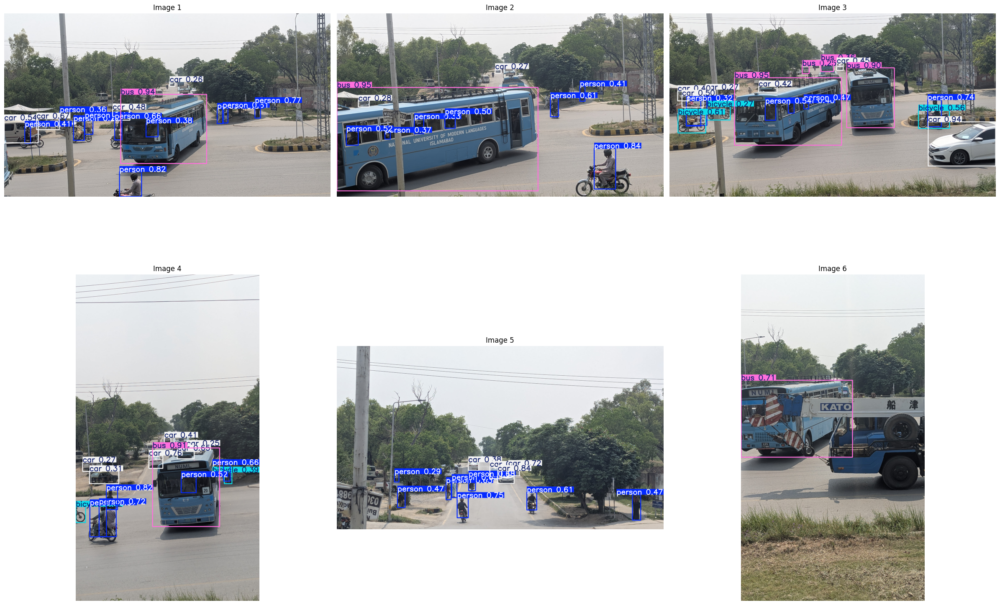

In [16]:
# To Detect Specific classes instead of COCO all classes
import cv2
import matplotlib.pyplot as plt

# Load your images
image_paths = [
    "/content/drive/MyDrive/DataSet/7upChock_Image_1.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_2.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_4.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_5.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_8.jpg",
    "/content/drive/MyDrive/DataSet/7upChock_Image_9.jpg"
]

# Classes to keep
TARGET_CLASSES = ['car', 'bus', 'person', 'bicycle']

# Run YOLO
results = model(image_paths, save=False)

plt.figure(figsize=(24, 24))

for i, r in enumerate(results):
    # Get label names
    class_names = model.names

    # Get mask of selected classes
    selected_mask = [class_names[int(cls)] in TARGET_CLASSES for cls in r.boxes.cls]

    # Filter boxes, scores, and class indices
    r.boxes = r.boxes[selected_mask]  # This filters all attributes (xyxy, conf, cls) in YOLOv8

    # Use YOLO's built-in plot function
    img = r.plot()
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(3, 3, i + 1)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f"Image {i+1}")

plt.tight_layout()
plt.show()

### Predict on Video Data

In [5]:
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 169MB/s]


In [6]:
video_path = "/content/drive/MyDrive/DataSet/7upChock_Video_4.mp4"


0: 384x640 12 persons, 5 cars, 8 motorcycles, 1 bus, 3 trucks, 1273.3ms
Speed: 29.5ms preprocess, 1273.3ms inference, 39.8ms postprocess per image at shape (1, 3, 384, 640)


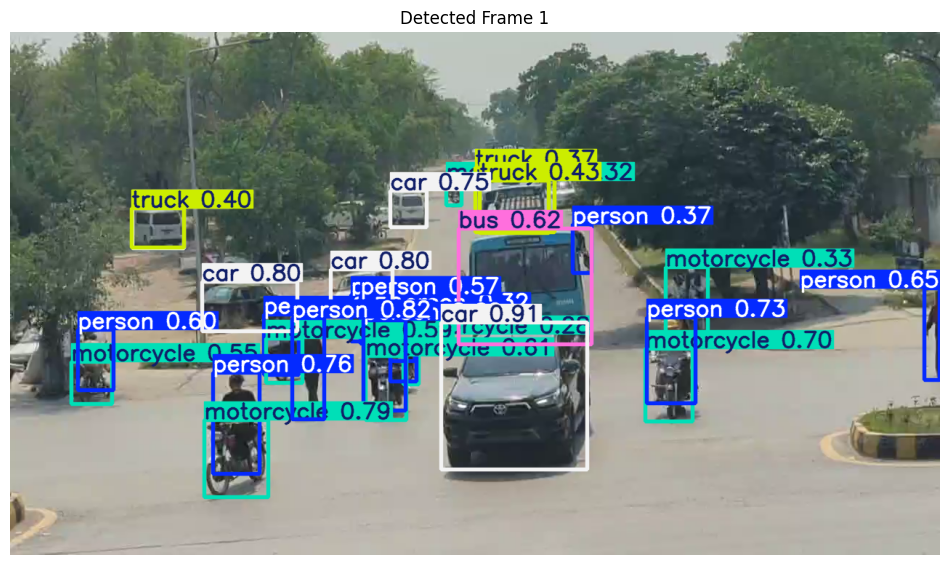


0: 384x640 11 persons, 5 cars, 6 motorcycles, 1 bus, 2 trucks, 1153.3ms
Speed: 3.4ms preprocess, 1153.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


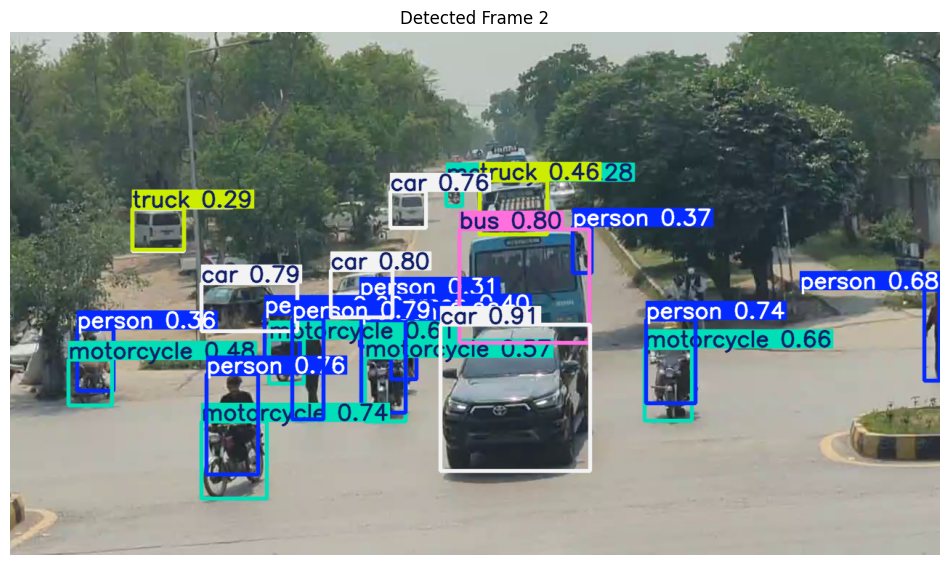


0: 384x640 10 persons, 5 cars, 6 motorcycles, 1 bus, 2 trucks, 1106.3ms
Speed: 3.5ms preprocess, 1106.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


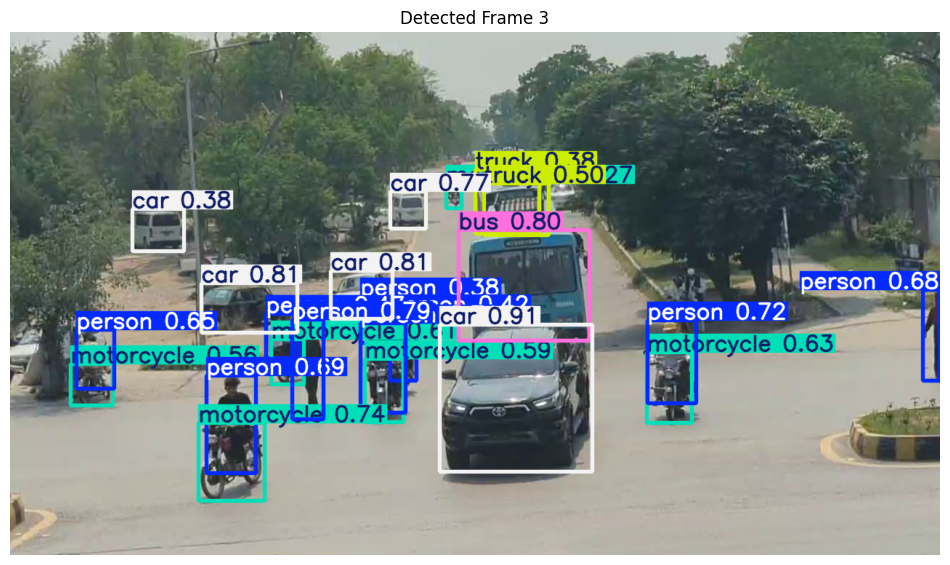

In [7]:

# Video open
cap = cv2.VideoCapture(video_path)

frame_count = 0

while frame_count < 3:  # Sirf 3 frames tak run karein basic test ke liye
    ret, frame = cap.read()
    if not ret:
        break

    # Inference (detection)
    results = model(frame)
    detected_frame = results[0].plot()

    # Convert BGR to RGB for matplotlib
    detected_frame_rgb = cv2.cvtColor(detected_frame, cv2.COLOR_BGR2RGB)

    # Show frame
    plt.figure(figsize=(12, 8))
    plt.imshow(detected_frame_rgb)
    plt.axis('off')
    plt.title(f"Detected Frame {frame_count+1}")
    plt.show()

    frame_count += 1

cap.release()


### Prection on Video Stream

In [1]:
# Check GPU avaliblity
import torch

if torch.cuda.is_available():
    print("✅ GPU is available!")
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("❌ GPU is NOT available. Running on CPU.")

✅ GPU is available!
GPU Name: Tesla T4


In [4]:
import time
from IPython.display import clear_output

# Load the YOLOv8 model
model = YOLO('yolov8m.pt')  # or your custom model path

# Path to your input video
video_path = "/content/drive/MyDrive/DataSet/7upChock_Video_5.mp4"  # change this to your actual video
cap = cv2.VideoCapture(video_path)

# Output video settings (Optional saving)
save_output = True  # change to False if you don't want to save
output_path = "/content/output_detected_video.avi"
fps = cap.get(cv2.CAP_PROP_FPS)
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

if save_output:
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

# Detection loop
frame_count = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # YOLO detection
    results = model(frame)
    detected_frame = results[0].plot()

    # Show frame in Colab
    detected_frame_rgb = cv2.cvtColor(detected_frame, cv2.COLOR_BGR2RGB)
    plt.imshow(detected_frame_rgb)
    plt.axis('off')
    plt.title(f"Frame {frame_count + 1}")
    display(plt.gcf())
    clear_output(wait=True)
    plt.clf()

    # Save if enabled
    if save_output:
        out.write(detected_frame)

    frame_count += 1

cap.release()
if save_output:
    out.release()

print(f"Detection complete. Total frames: {frame_count}")
if save_output:
    print(f"Saved video at: {output_path}")


Detection complete. Total frames: 886
Saved video at: /content/output_detected_video.avi


<Figure size 640x480 with 0 Axes>

## Extract Images from Video

In [32]:
# Extract images from video

import cv2
import os

# Path to your video
video_path = '/content/drive/MyDrive/DataSet/7upChock_Video_6.mp4'

# Output folder to save frames
output_folder = '/content/images'
os.makedirs(output_folder, exist_ok=True)

# Video reading
cap = cv2.VideoCapture(video_path)
frame_rate = 5  # Save every 5th frame

count = 0
image_num = 840

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if count % frame_rate == 0:
        filename = os.path.join(output_folder, f'7upChock_Image_{image_num}.jpg')
        cv2.imwrite(filename, frame)
        image_num += 1

    count += 1

cap.release()
print(f"Saved {image_num - 1} images in '{output_folder}'")


Saved 1402 images in '/content/images'


In [ ]:
# Romove Duplicat Images

import cv2
import os
import numpy as np
from skimage.metrics import structural_similarity as ssim

# Path where frames are saved
folder_path = "/content/images"
image_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".jpg")])

def mse(img1, img2):
    return np.mean((img1 - img2) ** 2)

# Threshold for considering two images as duplicates
MSE_THRESHOLD = 50  # Lower = stricter
# Or use SSIM_THRESHOLD = 0.98 if using SSIM

prev_img = None
removed = 0

for i, filename in enumerate(image_files):
    img_path = os.path.join(folder_path, filename)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if prev_img is not None:
        error = mse(prev_img, img)
        if error < MSE_THRESHOLD:
            os.remove(img_path)
            removed += 1
            print(f"🗑️ Removed duplicate: {filename}")
            continue

    prev_img = img

print(f"\n Finished. Removed {removed} duplicate images.")


In [13]:
#Renaming complete! Sab images ab sequence mein hain

import os
import re

folder = '/content/images'  # aapka images wala folder

# Sirf un files ko list karein jo '7upChock_Image_' se start hoti hain aur .jpg mein ho
files = [f for f in os.listdir(folder) if f.startswith('7upChock_Image_') and f.endswith('.jpg')]

def extract_num(filename):
    # Filename se number nikaalein (jo suffix hai)
    match = re.search(r'(\d+)', filename)
    return int(match.group(1)) if match else -1

# Files ko unke suffix number ke hisaab se sort karein
files_sorted = sorted(files, key=extract_num)

start_num = 10  # sequence yahan se shuru karni hai

for i, filename in enumerate(files_sorted):
    new_num = start_num + i
    new_name = f'7upChock_Image_{new_num:03}.jpg'  # 3 digit zero padding ke sath
    old_path = os.path.join(folder, filename)
    new_path = os.path.join(folder, new_name)
    os.rename(old_path, new_path)

print("Renaming complete! Sab images ab sequence mein hain.")


Renaming complete! Sab images ab sequence mein hain.


In [ ]:
# Merge Sort and Rename Module
import cv2
import os
import numpy as np
import re

folder = '/content/images'

def extract_num(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group(1)) if match else -1

# Step 1: Remove duplicates (your existing code)
files = sorted([f for f in os.listdir(folder) if f.startswith('7upChock_Image_') and f.endswith('.jpg')])

def mse(img1, img2):
    return np.mean((img1 - img2) ** 2)

MSE_THRESHOLD = 50

prev_img = None
removed = 0

for i, filename in enumerate(files):
    img_path = os.path.join(folder, filename)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if prev_img is not None:
        error = mse(prev_img, img)
        if error < MSE_THRESHOLD:
            os.remove(img_path)
            removed += 1
            print(f"🗑️ Removed duplicate: {filename}")
            continue

    prev_img = img

print(f"\nFinished removing duplicates. Total removed: {removed}")

# Step 2: Safe renaming to avoid name clashes

files_after = [f for f in os.listdir(folder) if f.startswith('7upChock_Image_') and f.endswith('.jpg')]
files_after_sorted = sorted(files_after, key=extract_num)

# First rename files to temporary names
for i, filename in enumerate(files_after_sorted):
    old_path = os.path.join(folder, filename)
    temp_name = f'temp_{i}.jpg'
    temp_path = os.path.join(folder, temp_name)
    os.rename(old_path, temp_path)

# Now rename temp files to final names starting from 178
start_num = 354
temp_files = sorted([f for f in os.listdir(folder) if f.startswith('temp_') and f.endswith('.jpg')])

for i, filename in enumerate(temp_files):
    old_path = os.path.join(folder, filename)
    new_num = start_num + i
    new_name = f'7upChock_Image_{new_num:03}.jpg'
    new_path = os.path.join(folder, new_name)
    os.rename(old_path, new_path)

print("Renaming complete! Sab images ab sequence mein hain.")


In [ ]:
# Zip the Folder
!zip -r images.zip /content/images


In [33]:
# Delete Folder
import shutil
import os

folder_path = '/content/images'
shutil.rmtree(folder_path)
